In [12]:

# ✅ Imports and Initialization
import os
import cv2
import numpy as np
import pandas as pd
import time
from ultralytics import YOLO
import matplotlib.pyplot as plt
from IPython.display import Image, display

# ✅ Define Paths
input_image_path = "IMG_NATURE.jpg"
labels_path = "coco.names"
output_yolo3 = "yolo3_output.jpg"
output_yolo4 = "yolo4_output.jpg"
output_yolo5 = "yolo5_output.jpg"
output_yolo8 = "yolo8_output.jpg"

# ✅ Check Required Files
required_files = [
    input_image_path, "yolov3.cfg", "yolov3.weights",
    "yolov4.cfg", "yolov4.weights", "yolov5s.pt", "yolov8s.pt", labels_path
]
for file in required_files:
    if not os.path.exists(file):
        print(f"❌ Required file missing: {file}")


❌ Required file missing: yolov5s.pt


# Object Detection with YOLO

This notebook provides a ready-to-run setup of the You Only Look Once (YOLO) v3 network for object detection. The [YOLO family of models](https://www.cv-foundation.org/openaccess/content_cvpr_2016/html/Redmon_You_Only_Look_CVPR_2016_paper.html) were created by [Joseph Chet Redmon](https://pjreddie.com/).  Training these models requires large data sets like [ImageNet]() and [Microsoft COCO]() and significant compute resources, making it infeasible for most users to train their own models.  Thankfully, the researchers have released the weights of their trained models and the community has developed code that allows these models to be run with frameworks like Pytorch and Tensorflow.  This notebook uses [code](https://github.com/experiencor/keras-yolo3) released under the MIT license by [Huynh Ngoc Anh](https://github.com/experiencor) to run the pre-trained YOLO model in Keras.

To use this notebook, you will need to download the YOLOv3 model weights from [https://pjreddie.com/media/files/yolov3.weights](https://pjreddie.com/media/files/yolov3.weights).  Place the `yolov3.weights` file in the same directory as this notebook.

You will need to change the `input_image_path` and `output_image_path` parameters.

In [14]:
import cv2
import os
import numpy as np
import pandas as pd
import time
from ultralytics import YOLO

# ✅ File Paths
# ✅ Check Required Files
required_files = [
    input_image_path, "yolov3.cfg", "yolov3.weights", 
    "yolov4.cfg", "yolov4.weights", "yolov5su.pt", "yolov8s.pt", labels_path
]

for file in required_files:
    if not os.path.exists(file):
        raise FileNotFoundError(f"❌ Required file missing: {file}")
print("✅ All required files found. Proceeding...")

input_image_path = "IMG_NATURE.jpg"  # Update if needed
output_yolo3 = "yolo3_output.jpg"
output_yolo4 = "yolo4_output.jpg"
output_yolo5 = "yolo5_output.jpg"
output_yolo8 = "yolo8_output.jpg"

# ✅ Define YOLO Model Configurations
yolo_configs = {
    "yolov3": {"config": "yolov3.cfg", "weights": "yolov3.weights"},
    "yolov4": {"config": "yolov4.cfg", "weights": "yolov4.weights"},
}

# ✅ Load Class Labels
labels_path = "coco.names"
with open(labels_path, "r") as f:
    labels = [line.strip() for line in f.readlines()]

# ✅ Function to Load YOLOv3 / YOLOv4 Model
def load_yolo(model_type):
    """Loads YOLOv3 or YOLOv4 using OpenCV's DNN module."""
    net = cv2.dnn.readNetFromDarknet(yolo_configs[model_type]["config"], yolo_configs[model_type]["weights"])
    net.setPreferableBackend(cv2.dnn.DNN_BACKEND_OPENCV)
    net.setPreferableTarget(cv2.dnn.DNN_TARGET_CPU)
    return net

# ✅ Function to Run Detection with OpenCV (YOLOv3 / YOLOv4)
def detect_objects_yolo(net, model_name, output_path):
    """Runs YOLOv3 or YOLOv4 on an input image and returns detected objects."""
    image = cv2.imread(input_image_path)
    if image is None:
        raise FileNotFoundError(f"❌ Error: Image file not found at {input_image_path}")
    
    (H, W) = image.shape[:2]
    start_time = time.time()

    # Convert image into YOLO format
    blob = cv2.dnn.blobFromImage(image, 1/255.0, (416, 416), swapRB=True, crop=False)
    net.setInput(blob)

    layer_names = net.getLayerNames()
    output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers()]
    layer_outputs = net.forward(output_layers)

    boxes, confidences, class_ids = [], [], []
    obj_thresh, nms_thresh = 0.5, 0.4

    for output in layer_outputs:
        for detection in output:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]

            if confidence > obj_thresh:
                box = detection[0:4] * np.array([W, H, W, H])
                (centerX, centerY, width, height) = box.astype("int")

                x = int(centerX - (width / 2))
                y = int(centerY - (height / 2))

                boxes.append([x, y, int(width), int(height)])
                confidences.append(float(confidence))
                class_ids.append(class_id)

    indices = cv2.dnn.NMSBoxes(boxes, confidences, obj_thresh, nms_thresh)
    inference_time = round(time.time() - start_time, 4)

    detected_objects = []
    
    if len(indices) > 0:
        for i in indices.flatten():
            detected_objects.append({
                "Model": model_name,
                "Object": labels[class_ids[i]],
                "Confidence": confidences[i],
                "Inference Time (s)": inference_time
            })
            (x, y, w, h) = boxes[i]
            color = (0, 255, 0)
            label = f"{labels[class_ids[i]]}: {confidences[i]:.2f}"
            cv2.rectangle(image, (x, y), (x + w, y + h), color, 2)
            cv2.putText(image, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    # Save the detected image
    cv2.imwrite(output_path, image)
    print(f"✅ Detection completed! Output saved as {output_path}")

    return detected_objects

# ✅ Function to Run YOLOv5 & YOLOv8 Detection & Save Image
def detect_objects_yolo_5_8(model_path, model_name, input_image, output_image):
    """Runs YOLOv5/YOLOv8 using Ultralytics package, saves detected image, and returns detected objects."""
    yolo_model = YOLO(model_path)  # Load YOLO model
    start_time = time.time()
    results = yolo_model(input_image)  # Run detection
    inference_time = round(time.time() - start_time, 4)

    image = cv2.imread(input_image)  # Read input image
    if image is None:
        raise FileNotFoundError(f"❌ Error: Image file not found at {input_image}")

    detections = []
    for result in results:
        for box in result.boxes.data:
            x1, y1, x2, y2, conf, class_id = map(int, box[:6].tolist())
            label = f"{labels[class_id]}: {conf:.2f}"
            detections.append({
                "Model": model_name,
                "Object": labels[class_id],
                "Confidence": conf,
                "Inference Time (s)": inference_time
            })

            # Draw bounding box
            color = (0, 255, 0)
            cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
            cv2.putText(image, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    # Save detected image
    cv2.imwrite(output_image, image)
    print(f"✅ {model_name} Detection completed! Output saved as {output_image}")

    return detections

# ✅ Run YOLOv3
print("🔄 Running YOLOv3...")
yolo3_model = load_yolo("yolov3")
detections_yolo3 = detect_objects_yolo(yolo3_model, "YOLOv3", output_yolo3)

# ✅ Run YOLOv4
print("🔄 Running YOLOv4...")
yolo4_model = load_yolo("yolov4")
detections_yolo4 = detect_objects_yolo(yolo4_model, "YOLOv4", output_yolo4)

# ✅ Run YOLOv5
print("🔄 Running YOLOv5...")
detections_yolo5 = detect_objects_yolo_5_8("yolov5su.pt", "YOLOv5", input_image_path, output_yolo5)

# ✅ Run YOLOv8
print("🔄 Running YOLOv8...")
detections_yolo8 = detect_objects_yolo_5_8("yolov8s.pt", "YOLOv8", input_image_path, output_yolo8)

# ✅ Combine results
all_detections = detections_yolo3 + detections_yolo4 + detections_yolo5 + detections_yolo8

# ✅ Convert results to DataFrame
df_results = pd.DataFrame(all_detections)

# ✅ Save the results to a CSV file
df_results.to_csv("yolo_comparison_results.csv", index=False)

# ✅ Generate Performance CSV
df_performance = df_results.groupby("Model").agg(
    {"Inference Time (s)": "mean", "Confidence": "mean"}
).reset_index()

df_performance.rename(columns={"Confidence": "Average Confidence Score"}, inplace=True)
df_performance.to_csv("yolo_performance_metrics.csv", index=False)

# ✅ Print Report
print("\n✅ YOLO Model Comparison Report Generated: yolo_comparison_results.csv")
print("\n✅ Performance Metrics Report Generated: yolo_performance_metrics.csv")

if not df_results.empty:
    print("\n--- YOLO Model Comparison ---")
    print(df_results.head(10))  # Display first 10 rows
    print("\n--- Performance Metrics ---")
    print(df_performance)
else:
    print("⚠️ No objects detected by any model.")

# ✅ Log number of objects detected per model
# print(f"📝 {model_name} detected {len(detected_objects)} objects.")



# ✅ Log number of objects detected per model
# print(f"📝 {model_name} detected {len(detections)} objects.")

# ✅ Log number of objects detected per model using returned detection lists
print(f"YOLOv3 detected {len(detections_yolo3)} objects.")
print(f"YOLOv4 detected {len(detections_yolo4)} objects.")
print(f"YOLOv5 detected {len(detections_yolo5)} objects.")
print(f"YOLOv8 detected {len(detections_yolo8)} objects.")



✅ All required files found. Proceeding...
🔄 Running YOLOv3...
✅ Detection completed! Output saved as yolo3_output.jpg
🔄 Running YOLOv4...
✅ Detection completed! Output saved as yolo4_output.jpg
🔄 Running YOLOv5...

image 1/1 C:\Users\debal\anaconda_projects\Object Detection\IMG_NATURE.jpg: 640x640 10 persons, 3 benchs, 13 birds, 10 dogs, 3 horses, 235.9ms
Speed: 4.4ms preprocess, 235.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
✅ YOLOv5 Detection completed! Output saved as yolo5_output.jpg
🔄 Running YOLOv8...

image 1/1 C:\Users\debal\anaconda_projects\Object Detection\IMG_NATURE.jpg: 640x640 10 persons, 4 benchs, 13 birds, 1 cat, 7 dogs, 3 horses, 1 potted plant, 290.0ms
Speed: 5.6ms preprocess, 290.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
✅ YOLOv8 Detection completed! Output saved as yolo8_output.jpg

✅ YOLO Model Comparison Report Generated: yolo_comparison_results.csv

✅ Performance Metrics Report Generated: yolo_performance_metri

📷 YOLOv3 Output


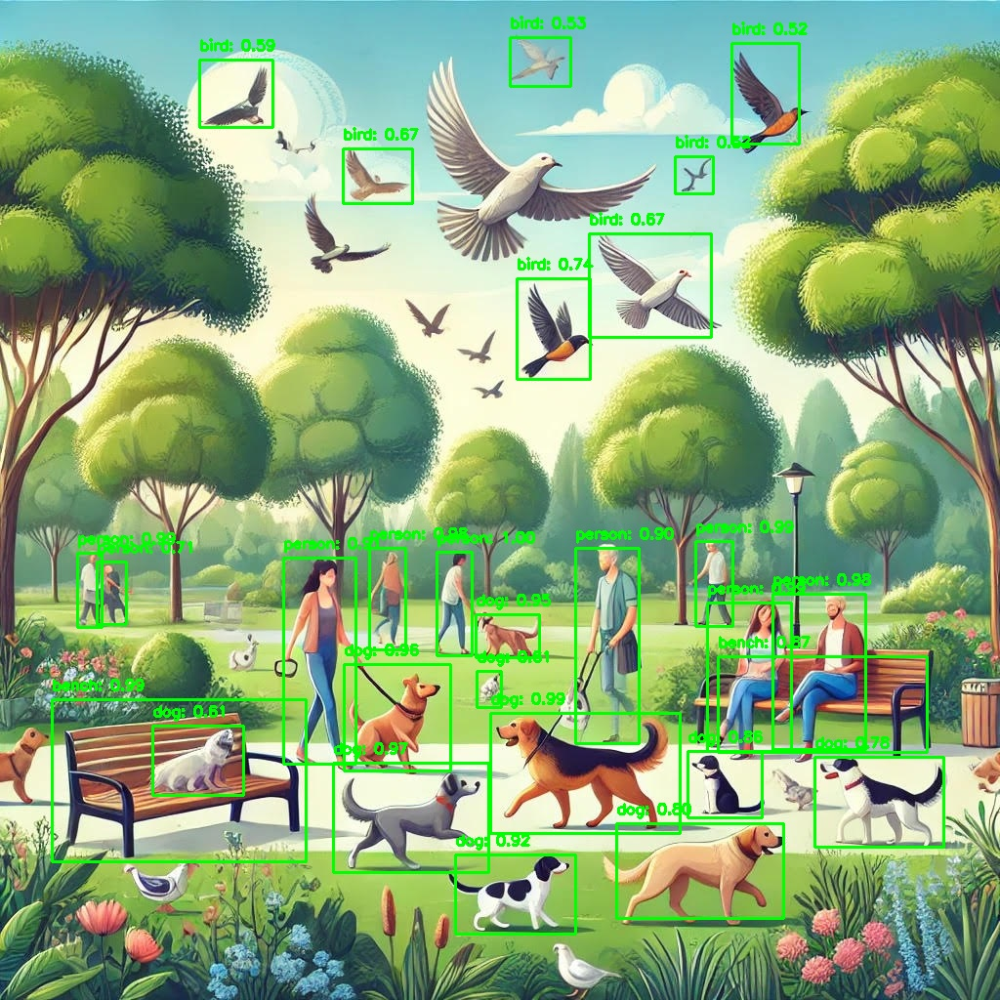

📷 YOLOv4 Output


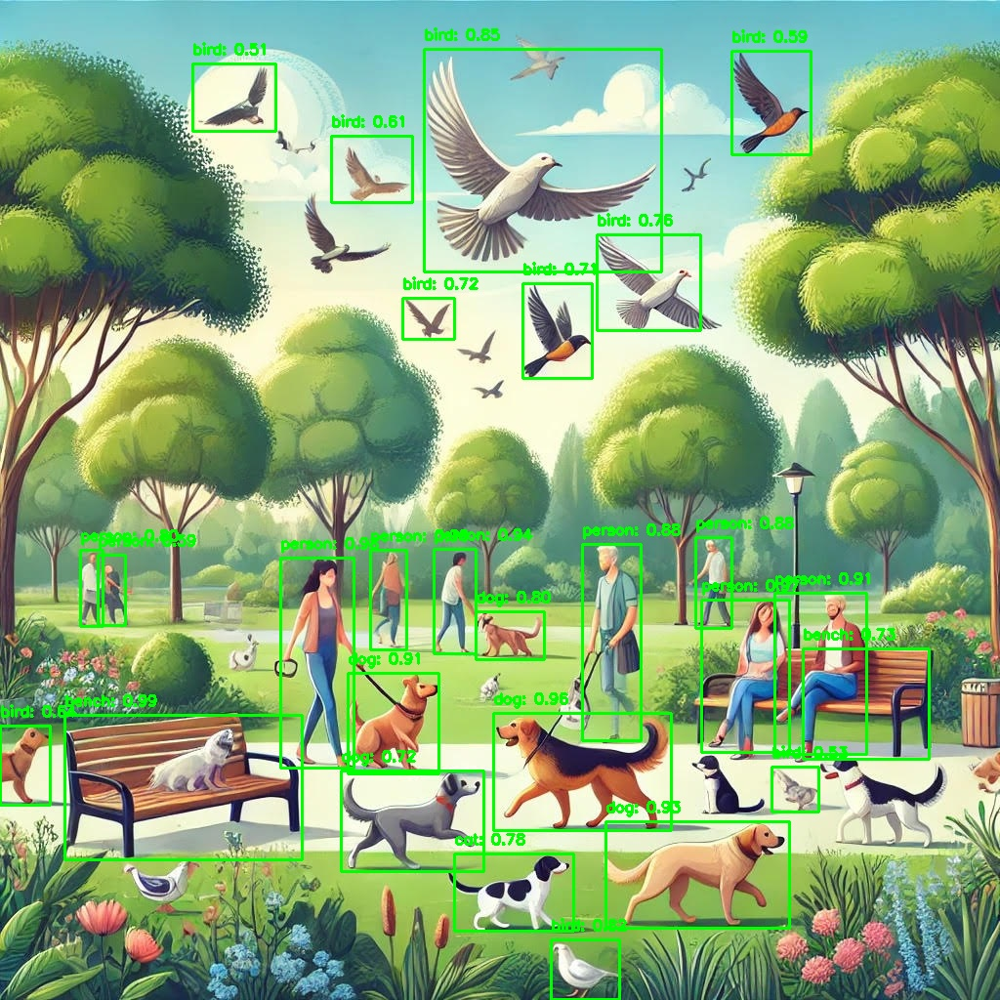

📷 YOLOv5 Output


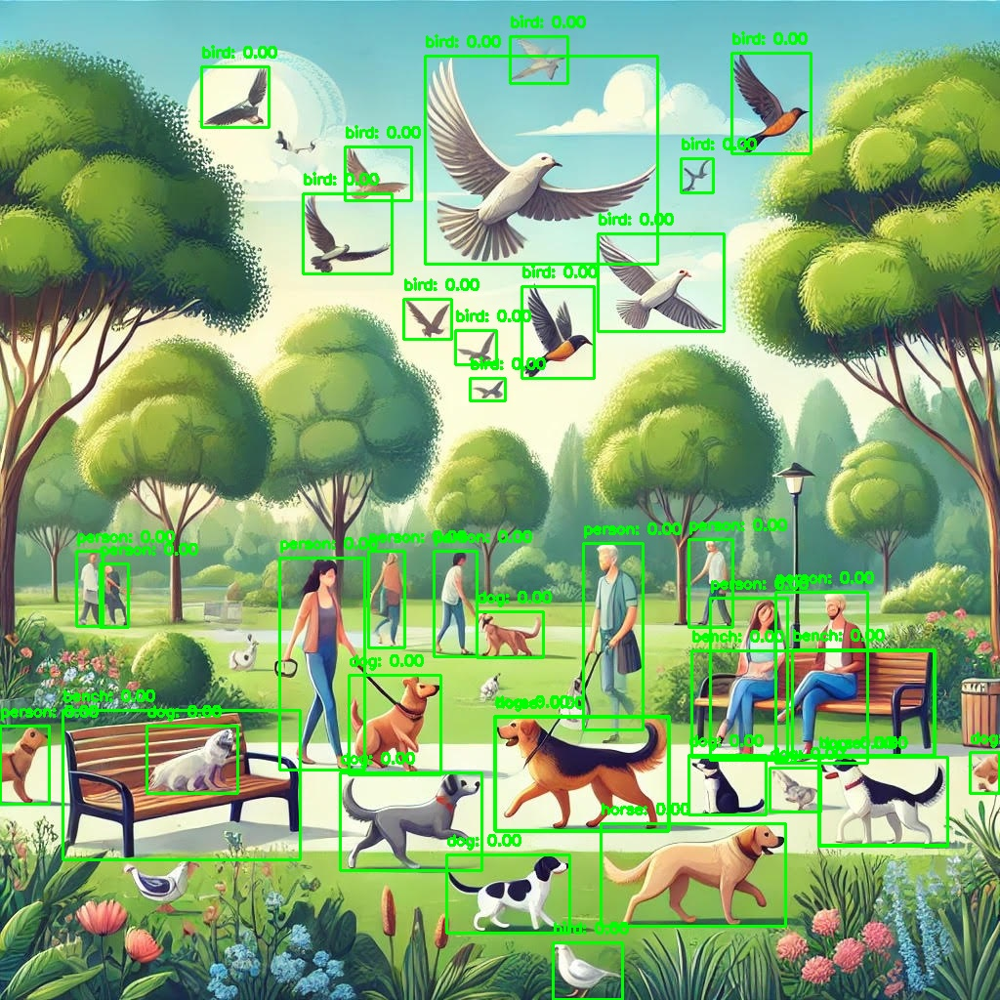

📷 YOLOv8 Output


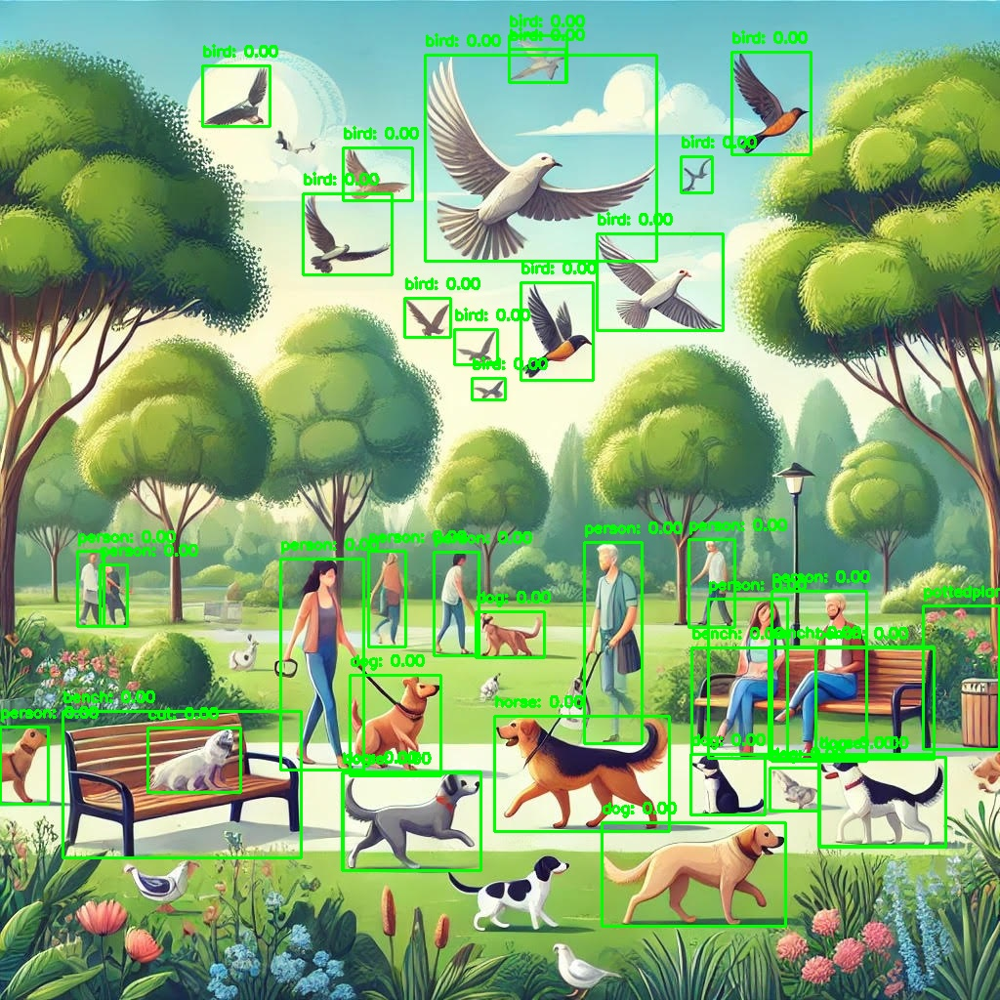

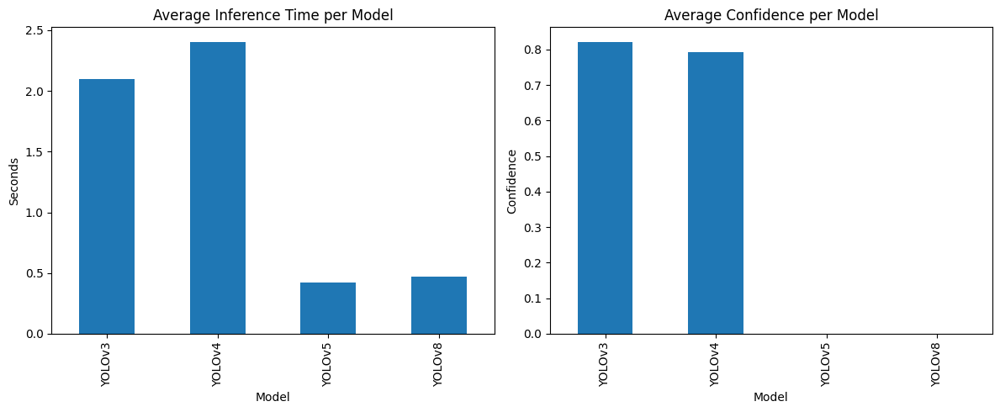

In [15]:
output_yolo3 = "yolo3_output.jpg"
output_yolo4 = "yolo4_output.jpg"
output_yolo5 = "yolo5_output.jpg"
output_yolo8 = "yolo8_output.jpg"



# ✅ Plot Detected Images
import matplotlib.pyplot as plt
from IPython.display import Image, display

def show_image(title, path):
    if os.path.exists(path):
        print(f"📷 {title}")
        display(Image(filename=path))
    else:
        print(f"⚠️ Image not found: {path}")

show_image("YOLOv3 Output", output_yolo3)
show_image("YOLOv4 Output", output_yolo4)
show_image("YOLOv5 Output", output_yolo5)
show_image("YOLOv8 Output", output_yolo8)

# ✅ Plot Performance Comparison
if not df_performance.empty:
    fig, ax = plt.subplots(1, 2, figsize=(12, 5))

    df_performance.plot(kind="bar", x="Model", y="Inference Time (s)", ax=ax[0], legend=False)
    ax[0].set_title("Average Inference Time per Model")
    ax[0].set_ylabel("Seconds")

    df_performance.plot(kind="bar", x="Model", y="Average Confidence Score", ax=ax[1], legend=False)
    ax[1].set_title("Average Confidence per Model")
    ax[1].set_ylabel("Confidence")

    plt.tight_layout()
    plt.show()
else:
    print("⚠️ No data available to plot performance metrics.")


# Custom Image PET

In [17]:
import cv2
import os
import numpy as np
import pandas as pd
import time
from ultralytics import YOLO

# ✅ File Paths
# ✅ Check Required Files
required_files = [
    input_image_path, "yolov3.cfg", "yolov3.weights", 
    "yolov4.cfg", "yolov4.weights", "yolov5su.pt", "yolov8s.pt", labels_path
]

for file in required_files:
    if not os.path.exists(file):
        raise FileNotFoundError(f"❌ Required file missing: {file}")
print("✅ All required files found. Proceeding...")

input_image_path = "mypet.jpg"  # Update if needed
output_yolo3 = "yolo3_petoutput.jpg"
output_yolo4 = "yolo4_petoutput.jpg"
output_yolo5 = "yolo5_petoutput.jpg"
output_yolo8 = "yolo8_petoutput.jpg"

# ✅ Define YOLO Model Configurations
yolo_configs = {
    "yolov3": {"config": "yolov3.cfg", "weights": "yolov3.weights"},
    "yolov4": {"config": "yolov4.cfg", "weights": "yolov4.weights"},
}

# ✅ Load Class Labels
labels_path = "coco.names"
with open(labels_path, "r") as f:
    labels = [line.strip() for line in f.readlines()]

# ✅ Function to Load YOLOv3 / YOLOv4 Model
def load_yolo(model_type):
    """Loads YOLOv3 or YOLOv4 using OpenCV's DNN module."""
    net = cv2.dnn.readNetFromDarknet(yolo_configs[model_type]["config"], yolo_configs[model_type]["weights"])
    net.setPreferableBackend(cv2.dnn.DNN_BACKEND_OPENCV)
    net.setPreferableTarget(cv2.dnn.DNN_TARGET_CPU)
    return net

# ✅ Function to Run Detection with OpenCV (YOLOv3 / YOLOv4)
def detect_objects_yolo(net, model_name, output_path):
    """Runs YOLOv3 or YOLOv4 on an input image and returns detected objects."""
    image = cv2.imread(input_image_path)
    if image is None:
        raise FileNotFoundError(f"❌ Error: Image file not found at {input_image_path}")
    
    (H, W) = image.shape[:2]
    start_time = time.time()

    # Convert image into YOLO format
    blob = cv2.dnn.blobFromImage(image, 1/255.0, (416, 416), swapRB=True, crop=False)
    net.setInput(blob)

    layer_names = net.getLayerNames()
    output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers()]
    layer_outputs = net.forward(output_layers)

    boxes, confidences, class_ids = [], [], []
    obj_thresh, nms_thresh = 0.5, 0.4

    for output in layer_outputs:
        for detection in output:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]

            if confidence > obj_thresh:
                box = detection[0:4] * np.array([W, H, W, H])
                (centerX, centerY, width, height) = box.astype("int")

                x = int(centerX - (width / 2))
                y = int(centerY - (height / 2))

                boxes.append([x, y, int(width), int(height)])
                confidences.append(float(confidence))
                class_ids.append(class_id)

    indices = cv2.dnn.NMSBoxes(boxes, confidences, obj_thresh, nms_thresh)
    inference_time = round(time.time() - start_time, 4)

    detected_objects = []
    
    if len(indices) > 0:
        for i in indices.flatten():
            detected_objects.append({
                "Model": model_name,
                "Object": labels[class_ids[i]],
                "Confidence": confidences[i],
                "Inference Time (s)": inference_time
            })
            (x, y, w, h) = boxes[i]
            color = (0, 255, 0)
            label = f"{labels[class_ids[i]]}: {confidences[i]:.2f}"
            cv2.rectangle(image, (x, y), (x + w, y + h), color, 2)
            cv2.putText(image, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    # Save the detected image
    cv2.imwrite(output_path, image)
    print(f"✅ Detection completed! Output saved as {output_path}")

    return detected_objects

# ✅ Function to Run YOLOv5 & YOLOv8 Detection & Save Image
def detect_objects_yolo_5_8(model_path, model_name, input_image, output_image):
    """Runs YOLOv5/YOLOv8 using Ultralytics package, saves detected image, and returns detected objects."""
    yolo_model = YOLO(model_path)  # Load YOLO model
    start_time = time.time()
    results = yolo_model(input_image)  # Run detection
    inference_time = round(time.time() - start_time, 4)

    image = cv2.imread(input_image)  # Read input image
    if image is None:
        raise FileNotFoundError(f"❌ Error: Image file not found at {input_image}")

    detections = []
    for result in results:
        for box in result.boxes.data:
            x1, y1, x2, y2, conf, class_id = map(int, box[:6].tolist())
            label = f"{labels[class_id]}: {conf:.2f}"
            detections.append({
                "Model": model_name,
                "Object": labels[class_id],
                "Confidence": conf,
                "Inference Time (s)": inference_time
            })

            # Draw bounding box
            color = (0, 255, 0)
            cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
            cv2.putText(image, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    # Save detected image
    cv2.imwrite(output_image, image)
    print(f"✅ {model_name} Detection completed! Output saved as {output_image}")

    return detections

# ✅ Run YOLOv3
print("🔄 Running YOLOv3...")
yolo3_model = load_yolo("yolov3")
detections_yolo3 = detect_objects_yolo(yolo3_model, "YOLOv3", output_yolo3)

# ✅ Run YOLOv4
print("🔄 Running YOLOv4...")
yolo4_model = load_yolo("yolov4")
detections_yolo4 = detect_objects_yolo(yolo4_model, "YOLOv4", output_yolo4)

# ✅ Run YOLOv5
print("🔄 Running YOLOv5...")
detections_yolo5 = detect_objects_yolo_5_8("yolov5su.pt", "YOLOv5", input_image_path, output_yolo5)

# ✅ Run YOLOv8
print("🔄 Running YOLOv8...")
detections_yolo8 = detect_objects_yolo_5_8("yolov8s.pt", "YOLOv8", input_image_path, output_yolo8)

# ✅ Combine results
all_detections = detections_yolo3 + detections_yolo4 + detections_yolo5 + detections_yolo8

# ✅ Convert results to DataFrame
df_results = pd.DataFrame(all_detections)

# ✅ Save the results to a CSV file
df_results.to_csv("yolo_petcomparison_results.csv", index=False)

# ✅ Generate Performance CSV
df_performance = df_results.groupby("Model").agg(
    {"Inference Time (s)": "mean", "Confidence": "mean"}
).reset_index()

df_performance.rename(columns={"Confidence": "Average Confidence Score"}, inplace=True)
df_performance.to_csv("yolo_petperformance_metrics.csv", index=False)

# ✅ Print Report
print("\n✅ YOLO Model Comparison Report Generated: yolo_petcomparison_results.csv")
print("\n✅ Performance Metrics Report Generated: yolo_petperformance_metrics.csv")

if not df_results.empty:
    print("\n--- YOLO Model Comparison ---")
    print(df_results.head(10))  # Display first 10 rows
    print("\n--- Performance Metrics ---")
    print(df_performance)
else:
    print("⚠️ No objects detected by any model.")

# ✅ Log number of objects detected per model
# print(f"📝 {model_name} detected {len(detected_objects)} objects.")



# ✅ Log number of objects detected per model
# print(f"📝 {model_name} detected {len(detections)} objects.")

# ✅ Log number of objects detected per model using returned detection lists
print(f"YOLOv3 detected {len(detections_yolo3)} objects.")
print(f"YOLOv4 detected {len(detections_yolo4)} objects.")
print(f"YOLOv5 detected {len(detections_yolo5)} objects.")
print(f"YOLOv8 detected {len(detections_yolo8)} objects.")



✅ All required files found. Proceeding...
🔄 Running YOLOv3...
✅ Detection completed! Output saved as yolo3_petoutput.jpg
🔄 Running YOLOv4...
✅ Detection completed! Output saved as yolo4_petoutput.jpg
🔄 Running YOLOv5...

image 1/1 C:\Users\debal\anaconda_projects\Object Detection\mypet.jpg: 480x640 2 persons, 1 dog, 1 microwave, 278.0ms
Speed: 3.9ms preprocess, 278.0ms inference, 2.3ms postprocess per image at shape (1, 3, 480, 640)
✅ YOLOv5 Detection completed! Output saved as yolo5_petoutput.jpg
🔄 Running YOLOv8...

image 1/1 C:\Users\debal\anaconda_projects\Object Detection\mypet.jpg: 480x640 2 persons, 1 dog, 1 bottle, 1 chair, 1 microwave, 1 book, 227.7ms
Speed: 3.7ms preprocess, 227.7ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)
✅ YOLOv8 Detection completed! Output saved as yolo8_petoutput.jpg

✅ YOLO Model Comparison Report Generated: yolo_petcomparison_results.csv

✅ Performance Metrics Report Generated: yolo_petperformance_metrics.csv

--- YOLO Model Comp

📷 YOLOv3 Output


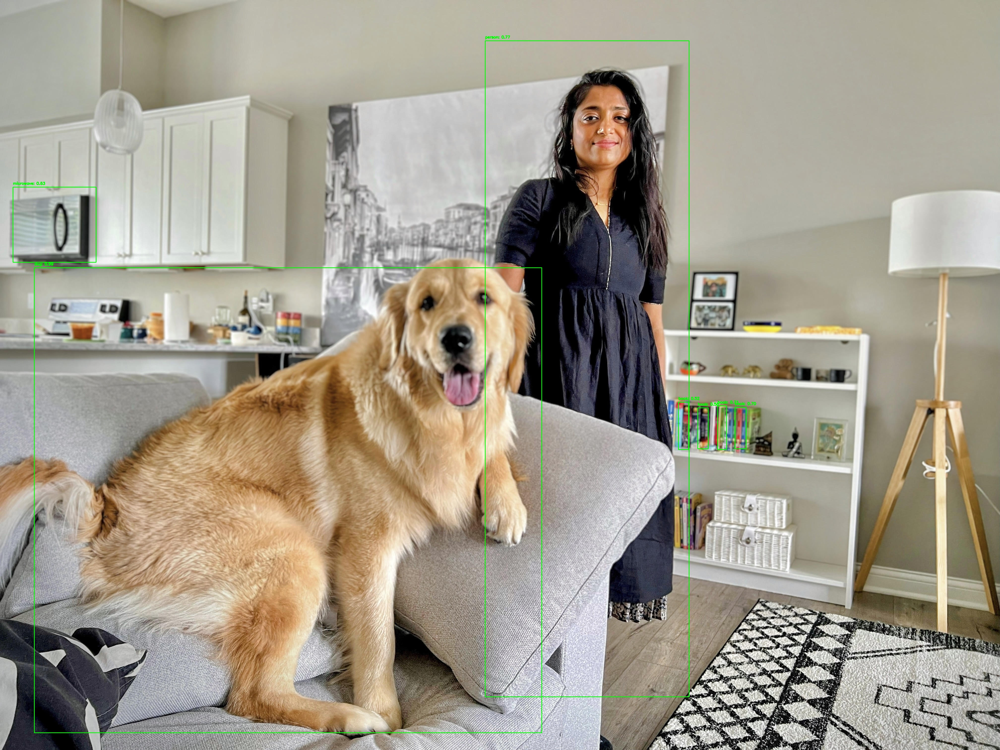

📷 YOLOv4 Output


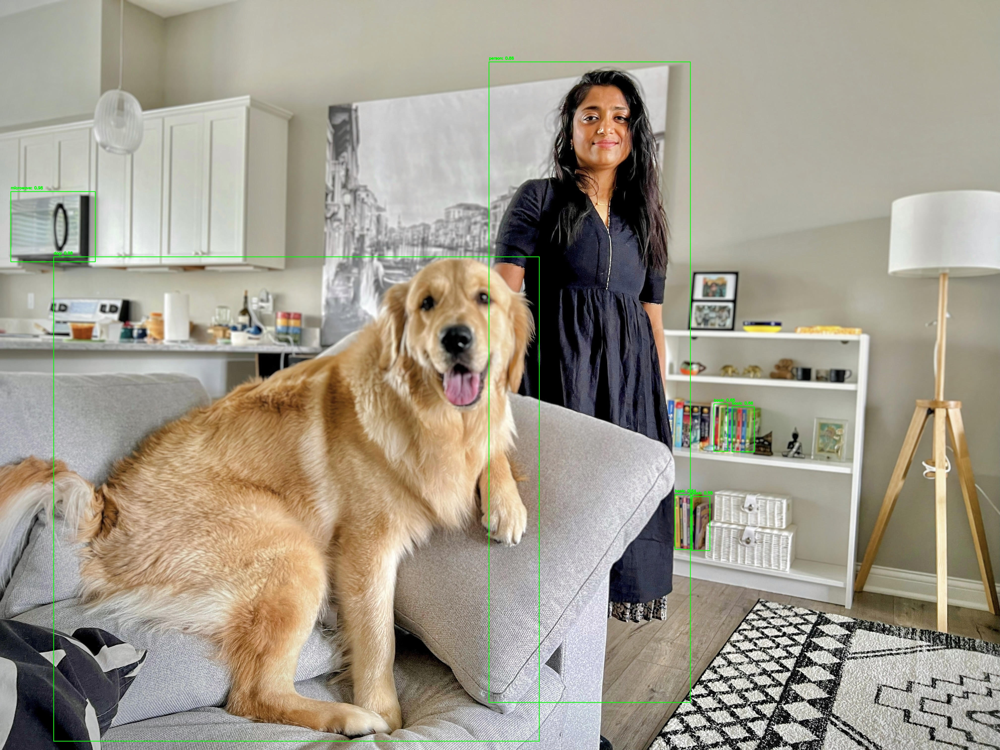

📷 YOLOv5 Output


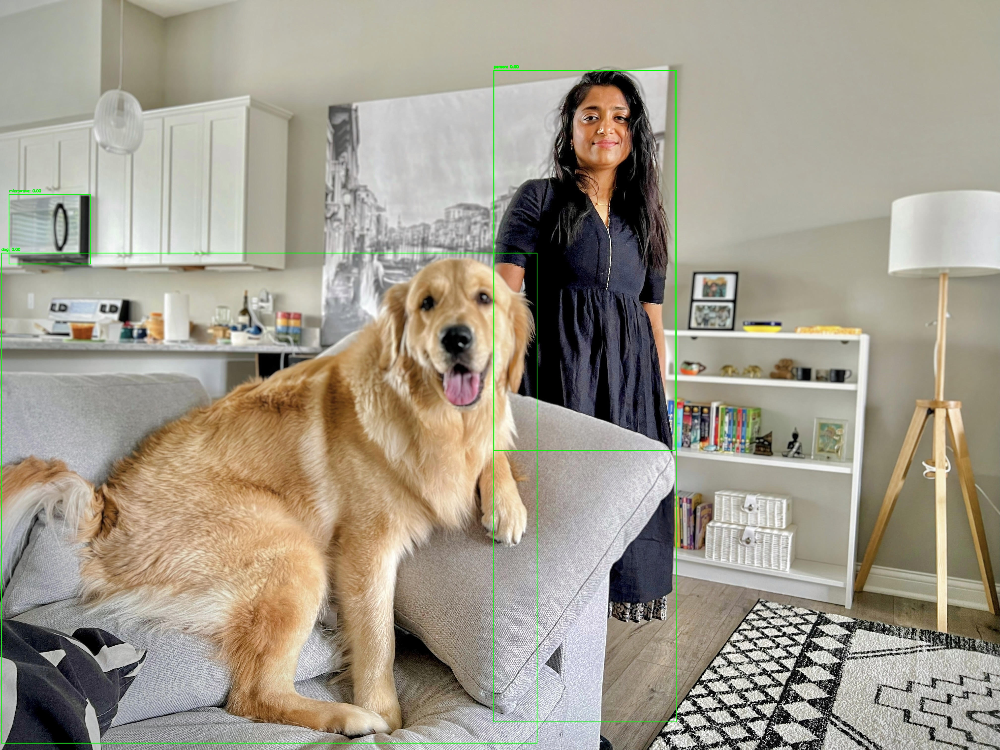

📷 YOLOv8 Output


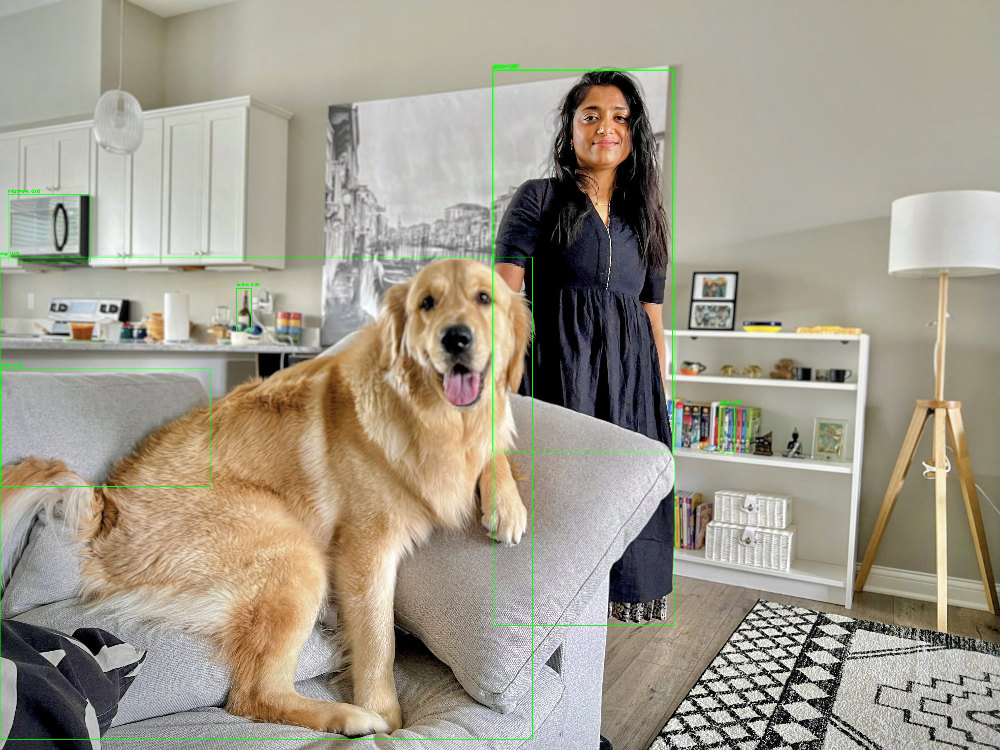

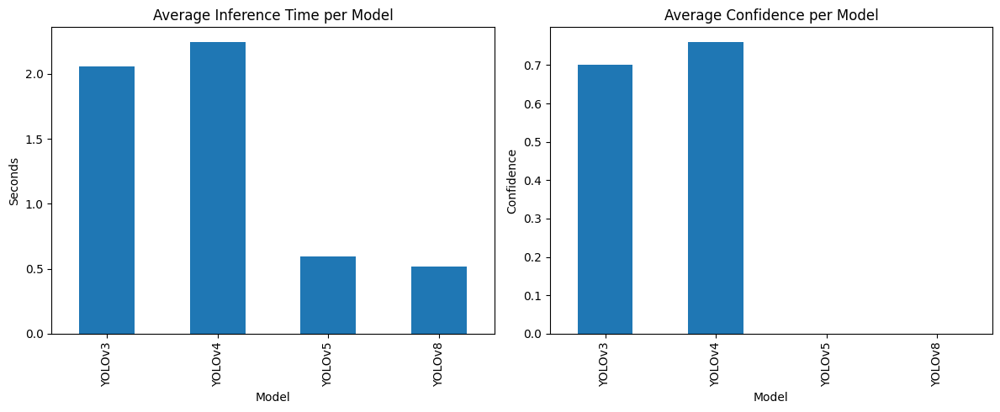

In [18]:
output_yolo3 = "yolo3_petoutput.jpg"
output_yolo4 = "yolo4_petoutput.jpg"
output_yolo5 = "yolo5_petoutput.jpg"
output_yolo8 = "yolo8_petoutput.jpg"



# ✅ Plot Detected Images
import matplotlib.pyplot as plt
from IPython.display import Image, display

def show_image(title, path):
    if os.path.exists(path):
        print(f"📷 {title}")
        display(Image(filename=path))
    else:
        print(f"⚠️ Image not found: {path}")

show_image("YOLOv3 Output", output_yolo3)
show_image("YOLOv4 Output", output_yolo4)
show_image("YOLOv5 Output", output_yolo5)
show_image("YOLOv8 Output", output_yolo8)

# ✅ Plot Performance Comparison
if not df_performance.empty:
    fig, ax = plt.subplots(1, 2, figsize=(12, 5))

    df_performance.plot(kind="bar", x="Model", y="Inference Time (s)", ax=ax[0], legend=False)
    ax[0].set_title("Average Inference Time per Model")
    ax[0].set_ylabel("Seconds")

    df_performance.plot(kind="bar", x="Model", y="Average Confidence Score", ax=ax[1], legend=False)
    ax[1].set_title("Average Confidence per Model")
    ax[1].set_ylabel("Confidence")

    plt.tight_layout()
    plt.show()
else:
    print("⚠️ No data available to plot performance metrics.")


# Custom Image DOW 

In [20]:
import cv2
import os
import numpy as np
import pandas as pd
import time
from ultralytics import YOLO

# ✅ File Paths
# ✅ Check Required Files
required_files = [
    input_image_path, "yolov3.cfg", "yolov3.weights", 
    "yolov4.cfg", "yolov4.weights", "yolov5su.pt", "yolov8s.pt", labels_path
]

for file in required_files:
    if not os.path.exists(file):
        raise FileNotFoundError(f"❌ Required file missing: {file}")
print("✅ All required files found. Proceeding...")

input_image_path = "dow.jpg"  # Update if needed
output_yolo3 = "yolo3_dowoutput.jpg"
output_yolo4 = "yolo4_dowoutput.jpg"
output_yolo5 = "yolo5_dowoutput.jpg"
output_yolo8 = "yolo8_dowoutput.jpg"

# ✅ Define YOLO Model Configurations
yolo_configs = {
    "yolov3": {"config": "yolov3.cfg", "weights": "yolov3.weights"},
    "yolov4": {"config": "yolov4.cfg", "weights": "yolov4.weights"},
}

# ✅ Load Class Labels
labels_path = "coco.names"
with open(labels_path, "r") as f:
    labels = [line.strip() for line in f.readlines()]

# ✅ Function to Load YOLOv3 / YOLOv4 Model
def load_yolo(model_type):
    """Loads YOLOv3 or YOLOv4 using OpenCV's DNN module."""
    net = cv2.dnn.readNetFromDarknet(yolo_configs[model_type]["config"], yolo_configs[model_type]["weights"])
    net.setPreferableBackend(cv2.dnn.DNN_BACKEND_OPENCV)
    net.setPreferableTarget(cv2.dnn.DNN_TARGET_CPU)
    return net

# ✅ Function to Run Detection with OpenCV (YOLOv3 / YOLOv4)
def detect_objects_yolo(net, model_name, output_path):
    """Runs YOLOv3 or YOLOv4 on an input image and returns detected objects."""
    image = cv2.imread(input_image_path)
    if image is None:
        raise FileNotFoundError(f"❌ Error: Image file not found at {input_image_path}")
    
    (H, W) = image.shape[:2]
    start_time = time.time()

    # Convert image into YOLO format
    blob = cv2.dnn.blobFromImage(image, 1/255.0, (416, 416), swapRB=True, crop=False)
    net.setInput(blob)

    layer_names = net.getLayerNames()
    output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers()]
    layer_outputs = net.forward(output_layers)

    boxes, confidences, class_ids = [], [], []
    obj_thresh, nms_thresh = 0.5, 0.4

    for output in layer_outputs:
        for detection in output:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]

            if confidence > obj_thresh:
                box = detection[0:4] * np.array([W, H, W, H])
                (centerX, centerY, width, height) = box.astype("int")

                x = int(centerX - (width / 2))
                y = int(centerY - (height / 2))

                boxes.append([x, y, int(width), int(height)])
                confidences.append(float(confidence))
                class_ids.append(class_id)

    indices = cv2.dnn.NMSBoxes(boxes, confidences, obj_thresh, nms_thresh)
    inference_time = round(time.time() - start_time, 4)

    detected_objects = []
    
    if len(indices) > 0:
        for i in indices.flatten():
            detected_objects.append({
                "Model": model_name,
                "Object": labels[class_ids[i]],
                "Confidence": confidences[i],
                "Inference Time (s)": inference_time
            })
            (x, y, w, h) = boxes[i]
            color = (0, 255, 0)
            label = f"{labels[class_ids[i]]}: {confidences[i]:.2f}"
            cv2.rectangle(image, (x, y), (x + w, y + h), color, 2)
            cv2.putText(image, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    # Save the detected image
    cv2.imwrite(output_path, image)
    print(f"✅ Detection completed! Output saved as {output_path}")

    return detected_objects

# ✅ Function to Run YOLOv5 & YOLOv8 Detection & Save Image
def detect_objects_yolo_5_8(model_path, model_name, input_image, output_image):
    """Runs YOLOv5/YOLOv8 using Ultralytics package, saves detected image, and returns detected objects."""
    yolo_model = YOLO(model_path)  # Load YOLO model
    start_time = time.time()
    results = yolo_model(input_image)  # Run detection
    inference_time = round(time.time() - start_time, 4)

    image = cv2.imread(input_image)  # Read input image
    if image is None:
        raise FileNotFoundError(f"❌ Error: Image file not found at {input_image}")

    detections = []
    for result in results:
        for box in result.boxes.data:
            x1, y1, x2, y2, conf, class_id = map(int, box[:6].tolist())
            label = f"{labels[class_id]}: {conf:.2f}"
            detections.append({
                "Model": model_name,
                "Object": labels[class_id],
                "Confidence": conf,
                "Inference Time (s)": inference_time
            })

            # Draw bounding box
            color = (0, 255, 0)
            cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
            cv2.putText(image, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    # Save detected image
    cv2.imwrite(output_image, image)
    print(f"✅ {model_name} Detection completed! Output saved as {output_image}")

    return detections

# ✅ Run YOLOv3
print("🔄 Running YOLOv3...")
yolo3_model = load_yolo("yolov3")
detections_yolo3 = detect_objects_yolo(yolo3_model, "YOLOv3", output_yolo3)

# ✅ Run YOLOv4
print("🔄 Running YOLOv4...")
yolo4_model = load_yolo("yolov4")
detections_yolo4 = detect_objects_yolo(yolo4_model, "YOLOv4", output_yolo4)

# ✅ Run YOLOv5
print("🔄 Running YOLOv5...")
detections_yolo5 = detect_objects_yolo_5_8("yolov5su.pt", "YOLOv5", input_image_path, output_yolo5)

# ✅ Run YOLOv8
print("🔄 Running YOLOv8...")
detections_yolo8 = detect_objects_yolo_5_8("yolov8s.pt", "YOLOv8", input_image_path, output_yolo8)

# ✅ Combine results
all_detections = detections_yolo3 + detections_yolo4 + detections_yolo5 + detections_yolo8

# ✅ Convert results to DataFrame
df_results = pd.DataFrame(all_detections)

# ✅ Save the results to a CSV file
df_results.to_csv("yolo_dowcomparison_results.csv", index=False)

# ✅ Generate Performance CSV
df_performance = df_results.groupby("Model").agg(
    {"Inference Time (s)": "mean", "Confidence": "mean"}
).reset_index()

df_performance.rename(columns={"Confidence": "Average Confidence Score"}, inplace=True)
df_performance.to_csv("yolo_dowperformance_metrics.csv", index=False)

# ✅ Print Report
print("\n✅ YOLO Model Comparison Report Generated: yolo_dowcomparison_results.csv")
print("\n✅ Performance Metrics Report Generated: yolo_dowperformance_metrics.csv")

if not df_results.empty:
    print("\n--- YOLO Model Comparison ---")
    print(df_results.head(10))  # Display first 10 rows
    print("\n--- Performance Metrics ---")
    print(df_performance)
else:
    print("⚠️ No objects detected by any model.")

# ✅ Log number of objects detected per model
# print(f"📝 {model_name} detected {len(detected_objects)} objects.")



# ✅ Log number of objects detected per model
# print(f"📝 {model_name} detected {len(detections)} objects.")

# ✅ Log number of objects detected per model using returned detection lists
print(f"YOLOv3 detected {len(detections_yolo3)} objects.")
print(f"YOLOv4 detected {len(detections_yolo4)} objects.")
print(f"YOLOv5 detected {len(detections_yolo5)} objects.")
print(f"YOLOv8 detected {len(detections_yolo8)} objects.")



✅ All required files found. Proceeding...
🔄 Running YOLOv3...
✅ Detection completed! Output saved as yolo3_dowoutput.jpg
🔄 Running YOLOv4...
✅ Detection completed! Output saved as yolo4_dowoutput.jpg
🔄 Running YOLOv5...

image 1/1 C:\Users\debal\anaconda_projects\Object Detection\dow.jpg: 384x640 15 persons, 1 bottle, 9 cups, 20 bowls, 3 chairs, 1 dining table, 162.4ms
Speed: 3.4ms preprocess, 162.4ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)
✅ YOLOv5 Detection completed! Output saved as yolo5_dowoutput.jpg
🔄 Running YOLOv8...

image 1/1 C:\Users\debal\anaconda_projects\Object Detection\dow.jpg: 384x640 16 persons, 1 bottle, 12 cups, 16 bowls, 3 chairs, 1 potted plant, 1 dining table, 191.8ms
Speed: 3.5ms preprocess, 191.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
✅ YOLOv8 Detection completed! Output saved as yolo8_dowoutput.jpg

✅ YOLO Model Comparison Report Generated: yolo_dowcomparison_results.csv

✅ Performance Metrics Report Generat

📷 YOLOv3 Output


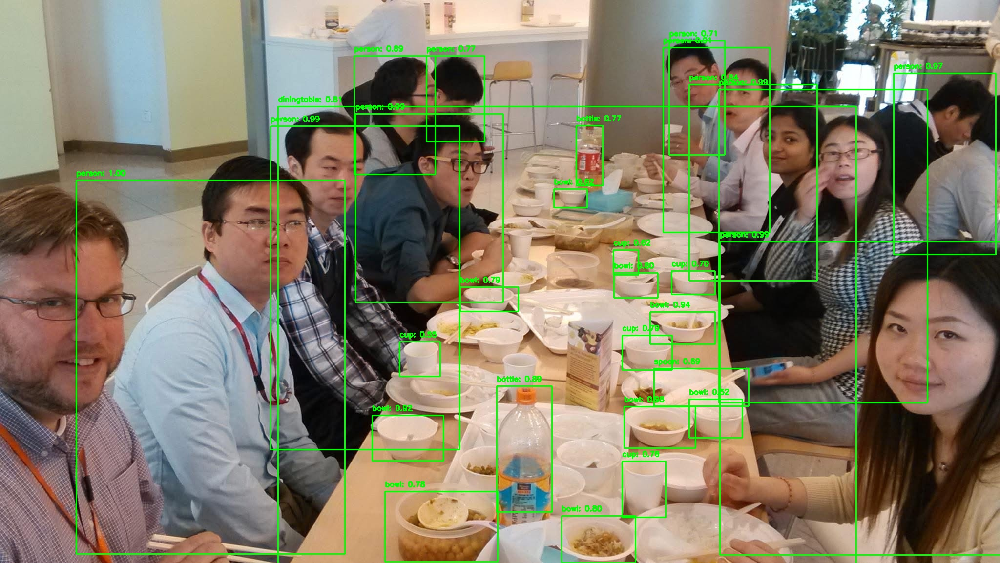

📷 YOLOv4 Output


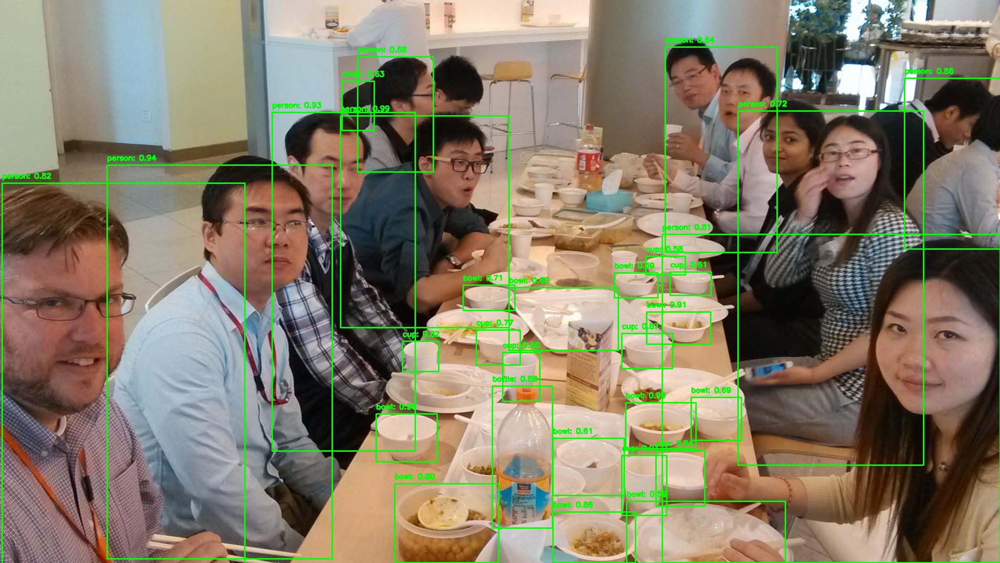

📷 YOLOv5 Output


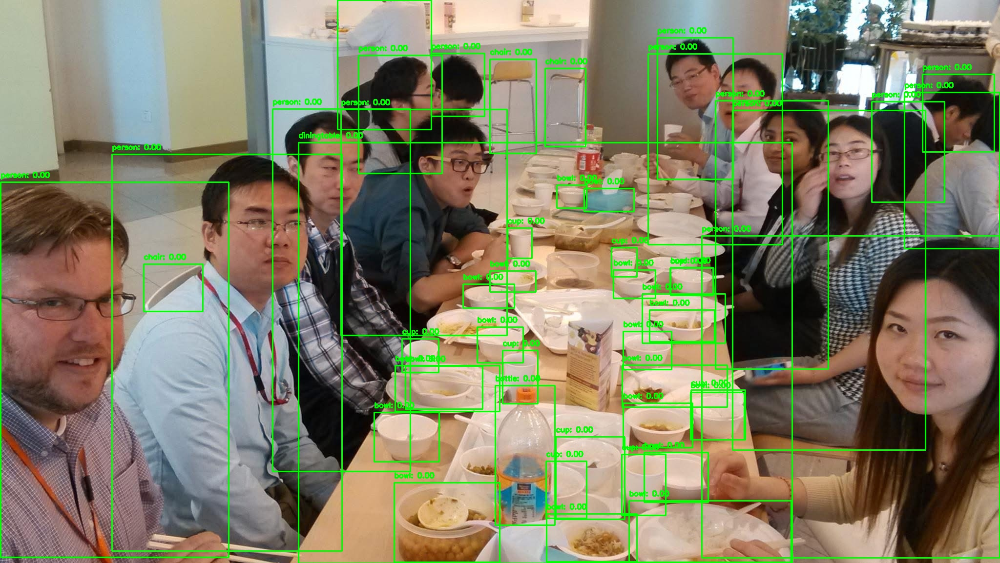

📷 YOLOv8 Output


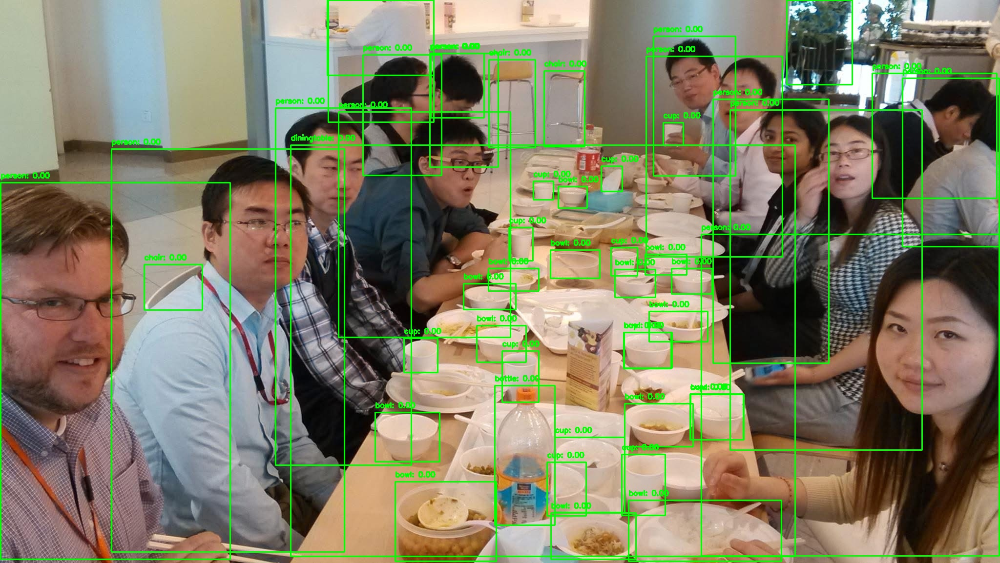

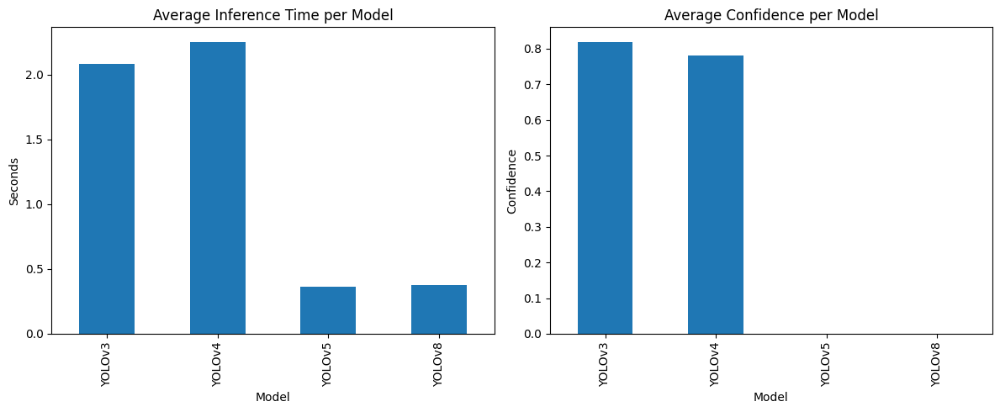

In [21]:
output_yolo3 = "yolo3_dowoutput.jpg"
output_yolo4 = "yolo4_dowoutput.jpg"
output_yolo5 = "yolo5_dowoutput.jpg"
output_yolo8 = "yolo8_dowoutput.jpg"



# ✅ Plot Detected Images
import matplotlib.pyplot as plt
from IPython.display import Image, display

def show_image(title, path):
    if os.path.exists(path):
        print(f"📷 {title}")
        display(Image(filename=path))
    else:
        print(f"⚠️ Image not found: {path}")

show_image("YOLOv3 Output", output_yolo3)
show_image("YOLOv4 Output", output_yolo4)
show_image("YOLOv5 Output", output_yolo5)
show_image("YOLOv8 Output", output_yolo8)

# ✅ Plot Performance Comparison
if not df_performance.empty:
    fig, ax = plt.subplots(1, 2, figsize=(12, 5))

    df_performance.plot(kind="bar", x="Model", y="Inference Time (s)", ax=ax[0], legend=False)
    ax[0].set_title("Average Inference Time per Model")
    ax[0].set_ylabel("Seconds")

    df_performance.plot(kind="bar", x="Model", y="Average Confidence Score", ax=ax[1], legend=False)
    ax[1].set_title("Average Confidence per Model")
    ax[1].set_ylabel("Confidence")

    plt.tight_layout()
    plt.show()
else:
    print("⚠️ No data available to plot performance metrics.")
